# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that **your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model**. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [6]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [7]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [8]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [9]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  ![](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)





In [10]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope=0.2, inplace=True)
        #### END CODE HERE ####
    )

In [11]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [12]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [13]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [14]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True
)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [15]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. **Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated**!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [34]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE #### 
    noise_vector = get_noise(num_images, z_dim, device=device)
    fake_images = gen(noise_vector)
    
    prediction_fake = disc(fake_images.detach())
    prediction_real = disc(real)
    
    y_true_fake = torch.zeros_like(prediction_real)
    y_true_real = torch.ones_like(prediction_fake)
    
    loss_fake = criterion(prediction_fake, y_true_fake)
    loss_real = criterion(prediction_real, y_true_real)
    
    disc_loss = (loss_fake + loss_real)/2

    #### END CODE HERE ####
    return disc_loss

In [35]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [50]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise_vector = get_noise(num_images, z_dim, device=device)
    fake_images = gen(noise_vector)
    disc_prediction = disc(fake_images)
    gen_loss = criterion(disc_prediction, torch.ones_like(disc_prediction))
    #### END CODE HERE ####
    return gen_loss

In [51]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

Step 500: Generator loss: 1.4285901892185207, discriminator loss: 0.4121212280988692


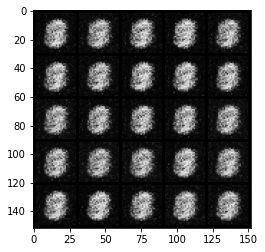

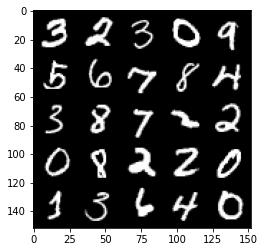

Step 1000: Generator loss: 1.7491643636226648, discriminator loss: 0.28117995148897207


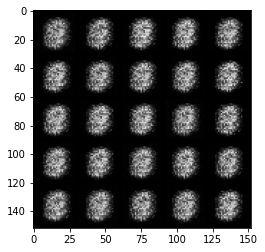

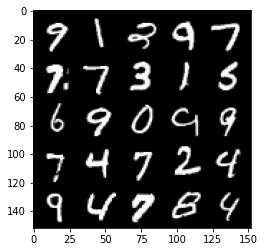

Step 1500: Generator loss: 2.0239611575603496, discriminator loss: 0.1672063862085343


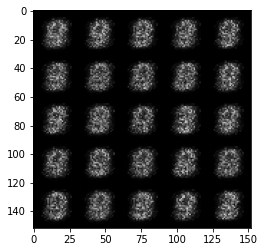

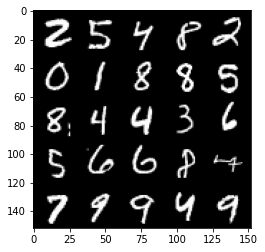

Step 2000: Generator loss: 1.7080474436283106, discriminator loss: 0.22172851911187177


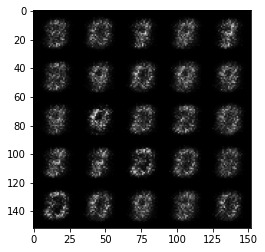

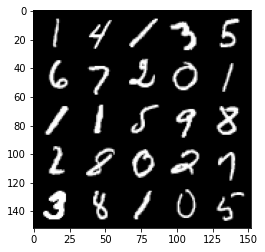

Step 2500: Generator loss: 1.61197449874878, discriminator loss: 0.23394230371713629


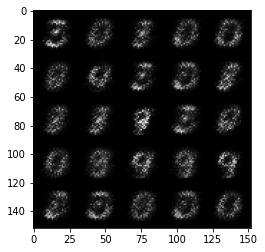

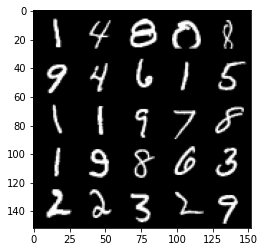

Step 3000: Generator loss: 1.857117091655731, discriminator loss: 0.18778178280591967


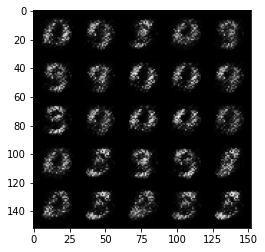

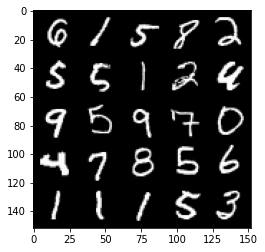

Step 3500: Generator loss: 2.380264126300812, discriminator loss: 0.12807485812902453


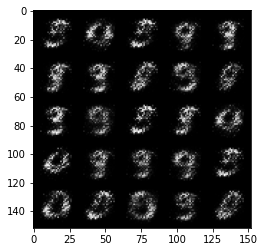

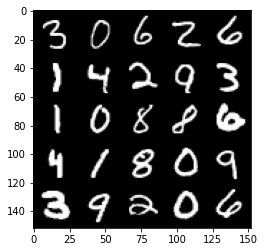

Step 4000: Generator loss: 2.9207369937896708, discriminator loss: 0.09268944475054744


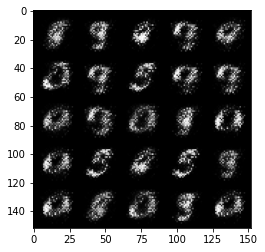

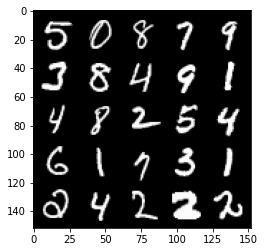

Step 4500: Generator loss: 3.312145733833311, discriminator loss: 0.07480850475281485


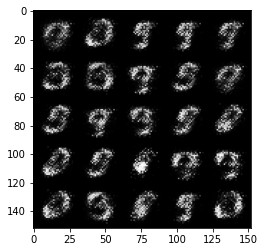

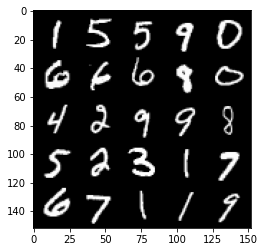

Step 5000: Generator loss: 3.4380424036979687, discriminator loss: 0.07526685424894099


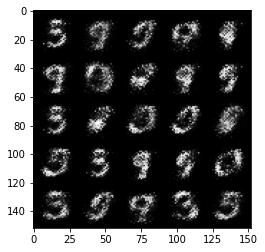

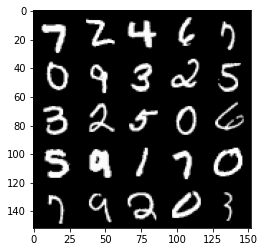

Step 5500: Generator loss: 3.7621244449615503, discriminator loss: 0.0712331487089395


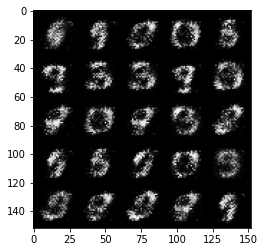

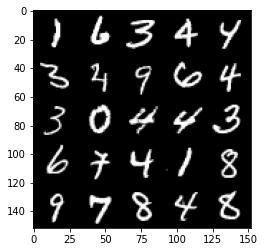

Step 6000: Generator loss: 3.9827143287658684, discriminator loss: 0.06597684719413516


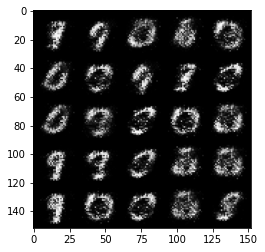

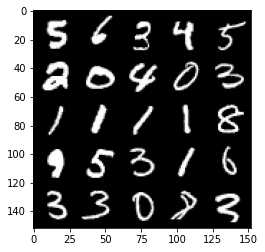

Step 6500: Generator loss: 3.942460556507109, discriminator loss: 0.05557150133699181


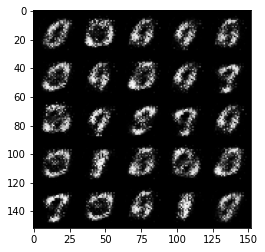

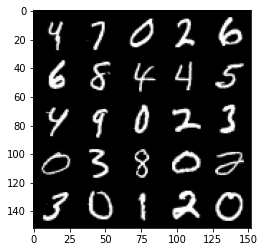

Step 7000: Generator loss: 3.992974609851837, discriminator loss: 0.05751260339841245


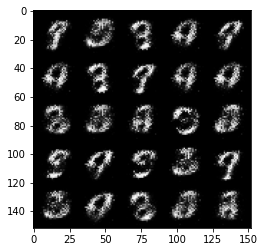

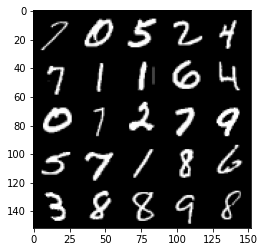

Step 7500: Generator loss: 3.911221796035765, discriminator loss: 0.061366636980324976


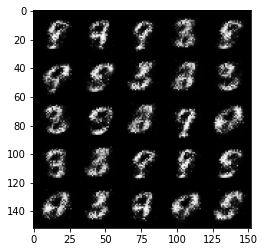

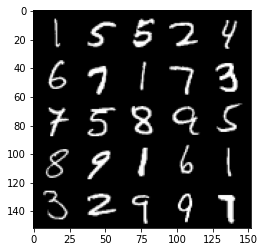

Step 8000: Generator loss: 3.885542702674867, discriminator loss: 0.0671282482631505


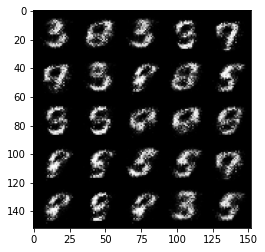

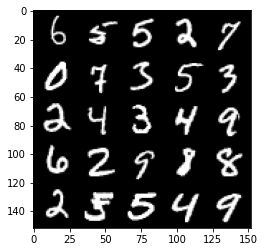

Step 8500: Generator loss: 4.113037920951842, discriminator loss: 0.06270348782464864


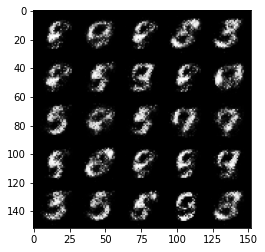

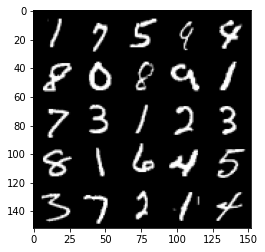

Step 9000: Generator loss: 4.154160575866697, discriminator loss: 0.059621675927191954


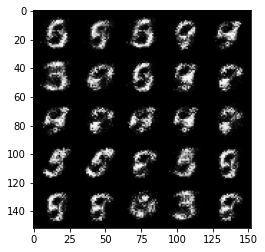

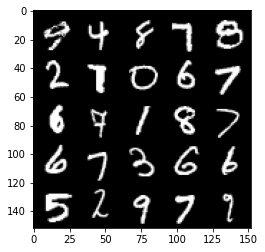

Step 9500: Generator loss: 4.1502059950828585, discriminator loss: 0.06572215487062932


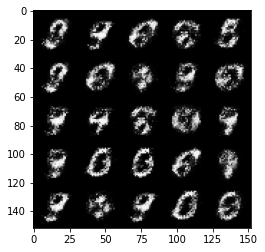

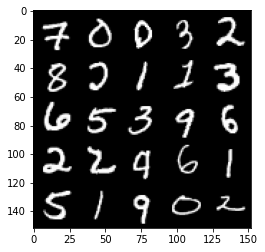

Step 10000: Generator loss: 3.94837948036194, discriminator loss: 0.06923797671869393


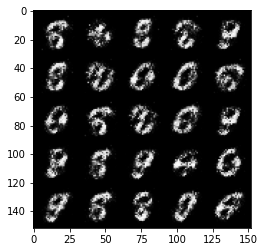

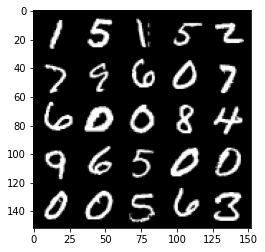

Step 10500: Generator loss: 4.172477246284488, discriminator loss: 0.059572894420474816


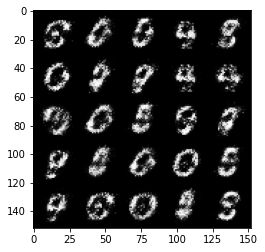

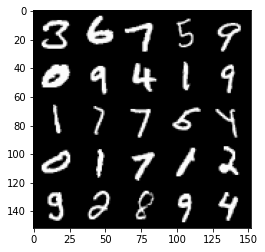

Step 11000: Generator loss: 4.020003746032716, discriminator loss: 0.0749041467085481


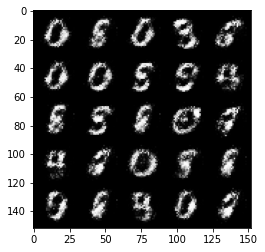

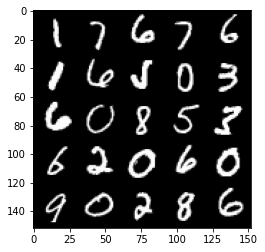

Step 11500: Generator loss: 3.8872404894828807, discriminator loss: 0.0717481727972627


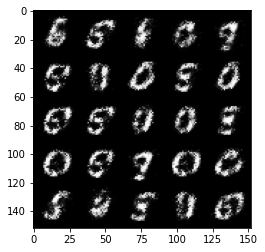

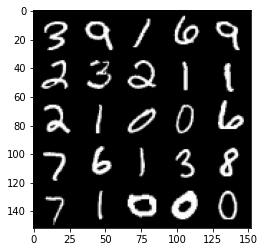

Step 12000: Generator loss: 3.6907401199340804, discriminator loss: 0.08752985688298937


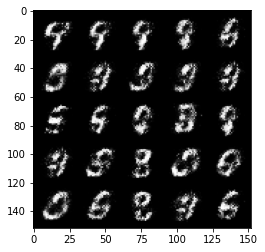

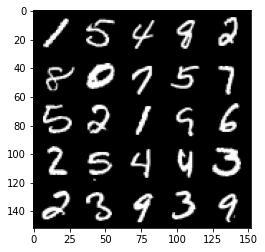

Step 12500: Generator loss: 3.8071855978965745, discriminator loss: 0.08398914293944841


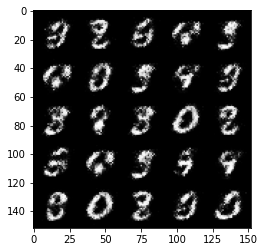

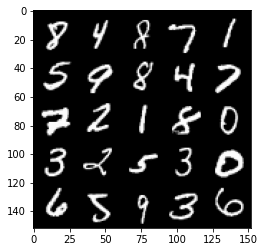

Step 13000: Generator loss: 3.7842649226188665, discriminator loss: 0.09200658550113433


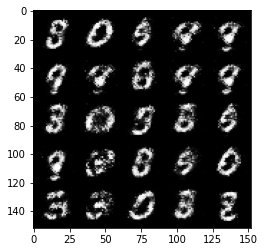

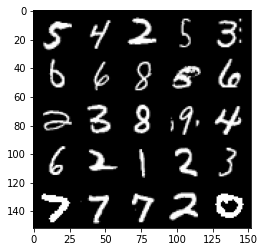

Step 13500: Generator loss: 3.875002931118011, discriminator loss: 0.0971760409027338


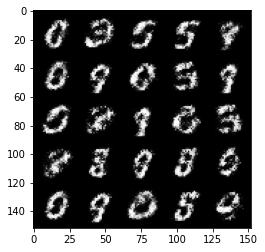

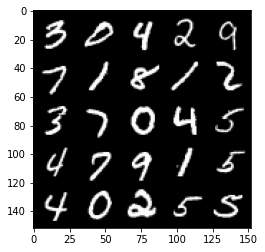

Step 14000: Generator loss: 3.7193637037277214, discriminator loss: 0.0961011945828795


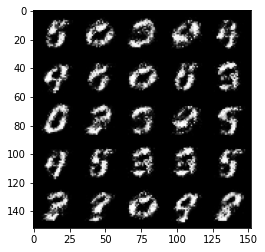

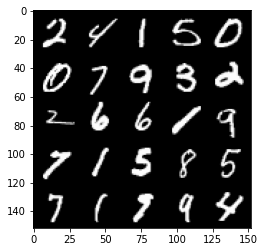

Step 14500: Generator loss: 3.75212739276886, discriminator loss: 0.08993239099532357


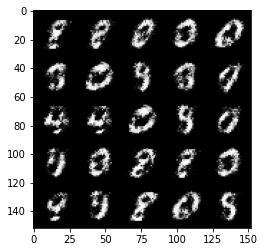

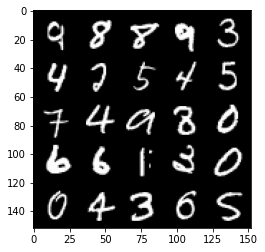

Step 15000: Generator loss: 3.801649930000305, discriminator loss: 0.09850217815488577


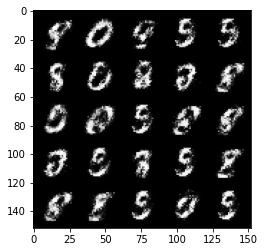

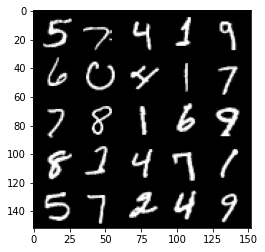

Step 15500: Generator loss: 3.6223987092971797, discriminator loss: 0.11765977698564532


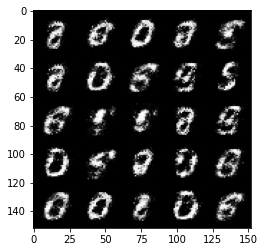

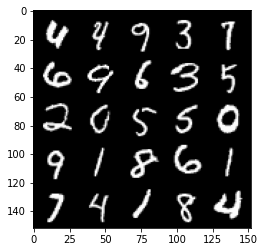

Step 16000: Generator loss: 3.6874700036048877, discriminator loss: 0.10398429413884874


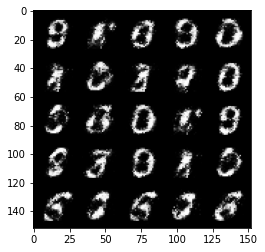

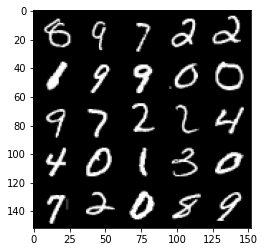

Step 16500: Generator loss: 3.7944075603485112, discriminator loss: 0.1259986273348332


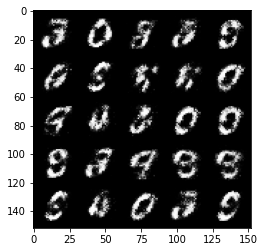

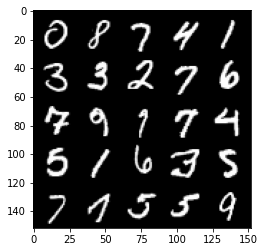

Step 17000: Generator loss: 3.597009753227235, discriminator loss: 0.14048438256978987


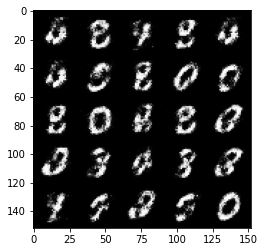

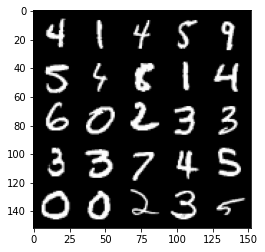

Step 17500: Generator loss: 3.485621131896972, discriminator loss: 0.13069490477442744


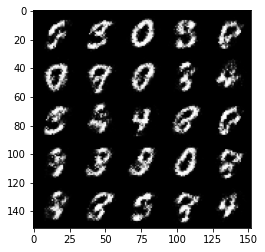

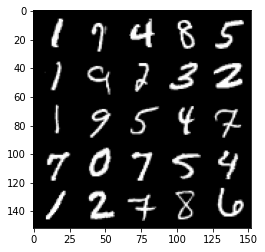

Step 18000: Generator loss: 3.423970845222475, discriminator loss: 0.14030689913779507


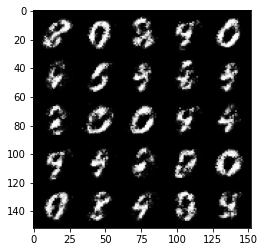

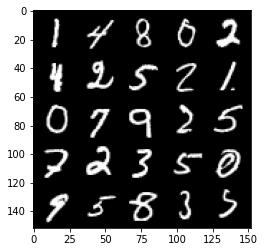

Step 18500: Generator loss: 3.3545633754730235, discriminator loss: 0.1269598662406206


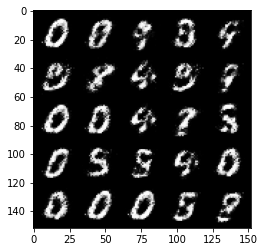

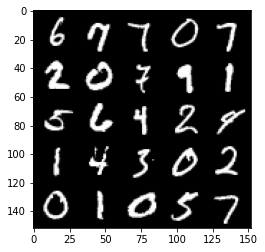

Step 19000: Generator loss: 3.462615118980408, discriminator loss: 0.13065064413845542


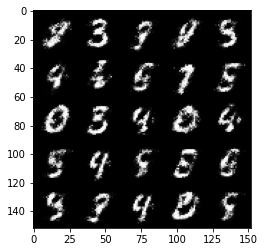

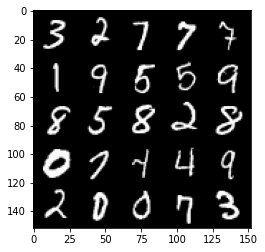

Step 19500: Generator loss: 3.3407041301727314, discriminator loss: 0.1494314465671777


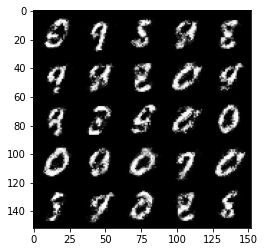

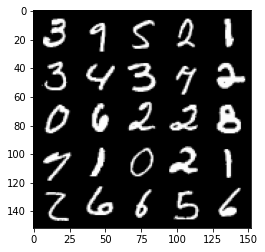

Step 20000: Generator loss: 3.1773761429786673, discriminator loss: 0.16507556898891923


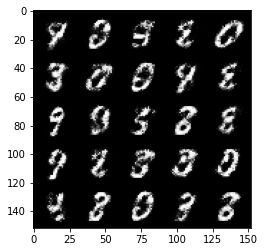

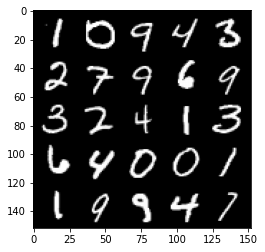

Step 20500: Generator loss: 3.232138791561126, discriminator loss: 0.16551741850376128


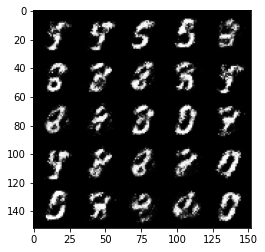

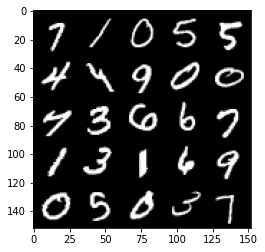

Step 21000: Generator loss: 3.1338872942924487, discriminator loss: 0.18301969894766795


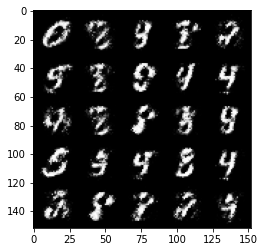

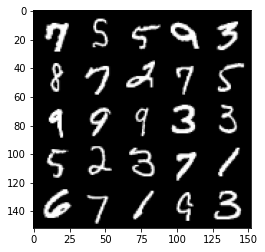

Step 21500: Generator loss: 3.139186413764954, discriminator loss: 0.1680434044450522


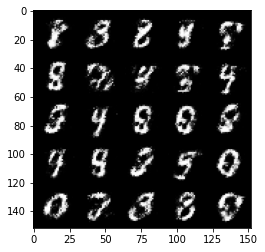

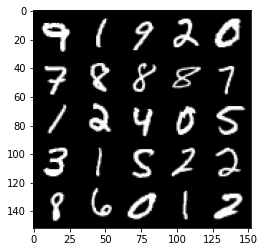

Step 22000: Generator loss: 3.1577078127861027, discriminator loss: 0.17164172650873658


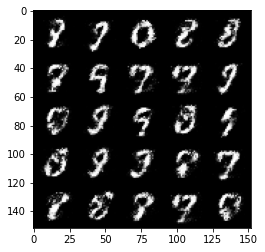

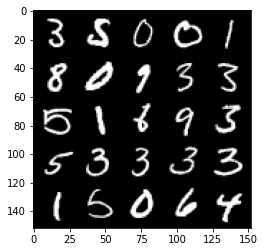

Step 22500: Generator loss: 3.008984547615051, discriminator loss: 0.18084637954831115


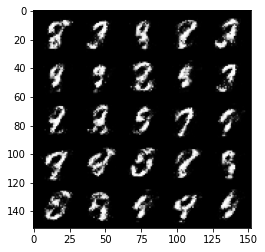

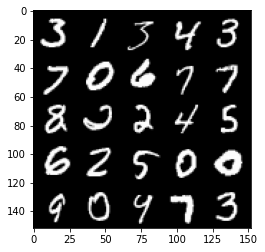

Step 23000: Generator loss: 3.1094296078681944, discriminator loss: 0.1679466276764871


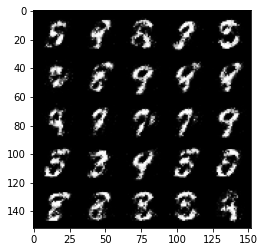

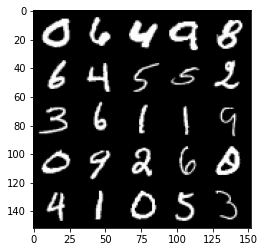

Step 23500: Generator loss: 3.095781006336213, discriminator loss: 0.19748602767288667


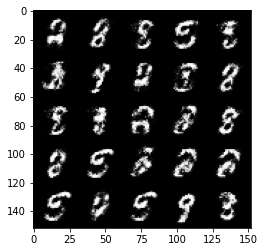

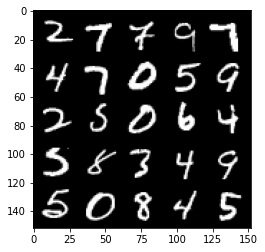

Step 24000: Generator loss: 3.034403259277345, discriminator loss: 0.18845568215847014


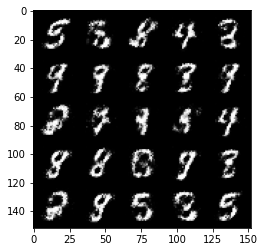

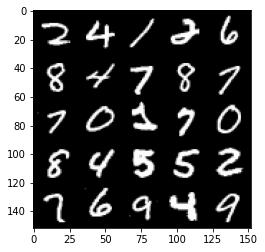

Step 24500: Generator loss: 3.0185817918777467, discriminator loss: 0.1894335232377053


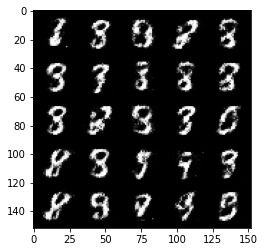

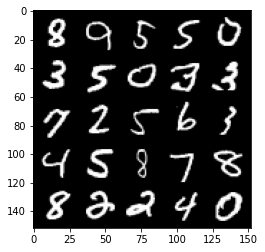

Step 25000: Generator loss: 2.977375538349149, discriminator loss: 0.19636386831104743


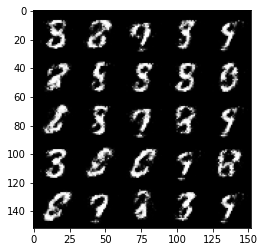

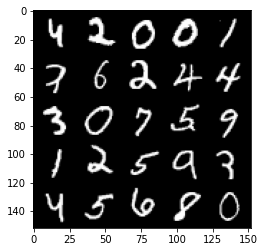

Step 25500: Generator loss: 3.0709347977638246, discriminator loss: 0.17309771229326718


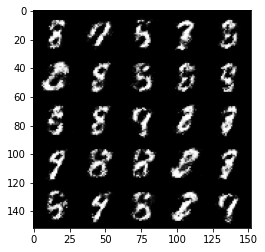

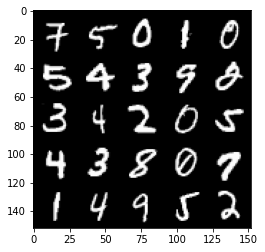

Step 26000: Generator loss: 3.026609739303589, discriminator loss: 0.18763897974789145


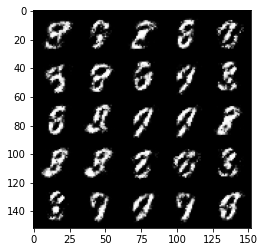

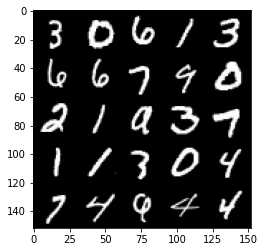

Step 26500: Generator loss: 2.8362802796363833, discriminator loss: 0.21410425463318816


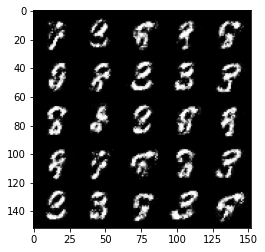

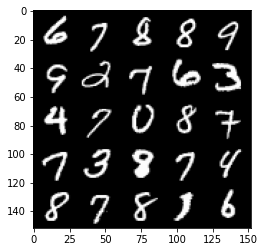

Step 27000: Generator loss: 2.8152514052391036, discriminator loss: 0.21240972855687135


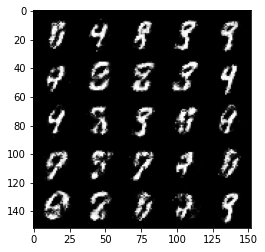

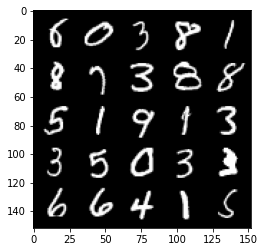

Step 27500: Generator loss: 2.9598792285919204, discriminator loss: 0.1898977186232805


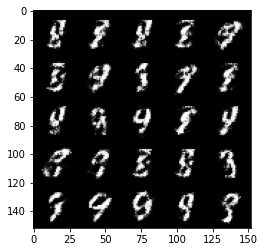

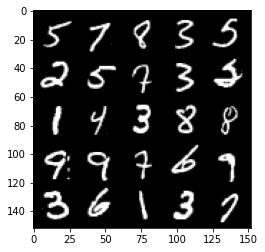

Step 28000: Generator loss: 2.894117256641388, discriminator loss: 0.21673923203349113


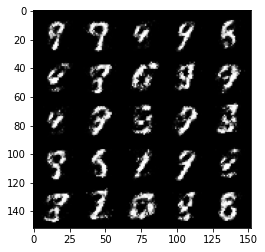

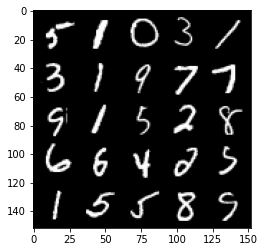

Step 28500: Generator loss: 2.8058234906196593, discriminator loss: 0.22178327524662017


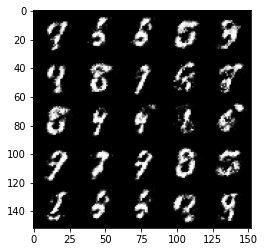

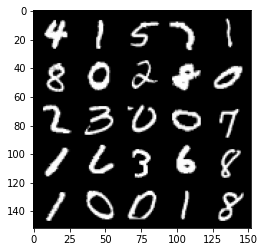

Step 29000: Generator loss: 2.7187481565475458, discriminator loss: 0.23732145309448233


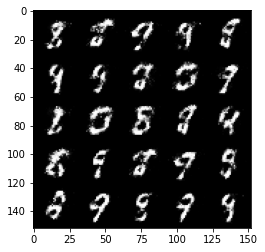

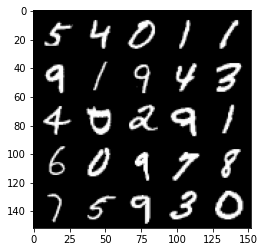

Step 29500: Generator loss: 2.609187408447266, discriminator loss: 0.22792545083165155


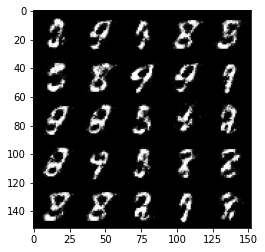

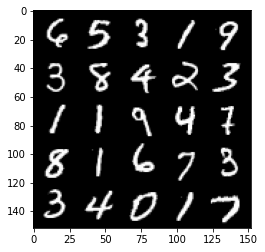

Step 30000: Generator loss: 2.8243208346366875, discriminator loss: 0.20887233786284923


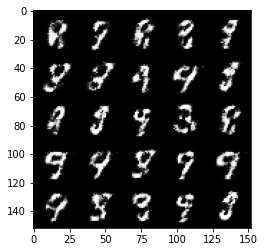

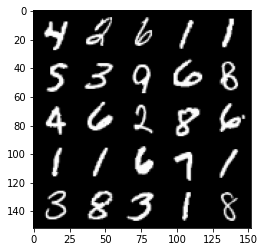

Step 30500: Generator loss: 2.5352188849449173, discriminator loss: 0.26167936417460436


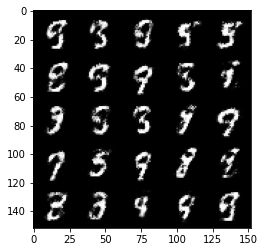

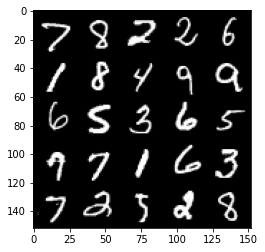

Step 31000: Generator loss: 2.660414481163025, discriminator loss: 0.22956438741087903


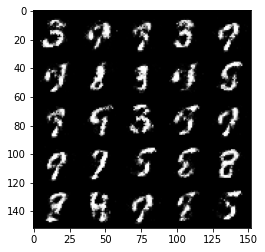

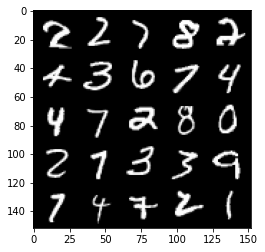

Step 31500: Generator loss: 2.6270646004676825, discriminator loss: 0.2351616603136061


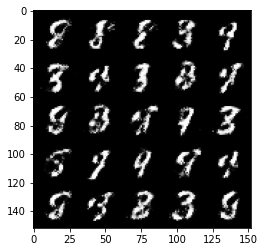

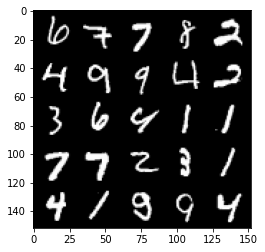

Step 32000: Generator loss: 2.5603324222564705, discriminator loss: 0.2621437918841838


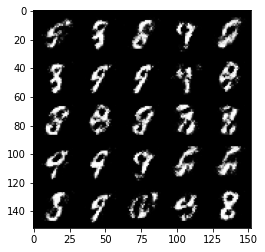

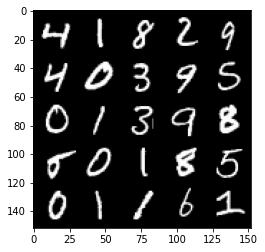

Step 32500: Generator loss: 2.657627719879151, discriminator loss: 0.23218340885639202


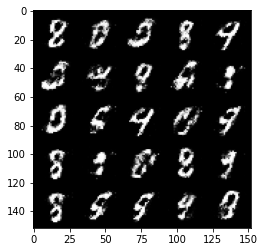

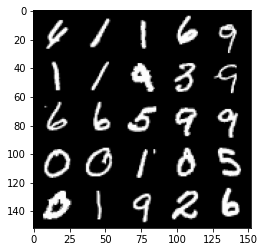

Step 33000: Generator loss: 2.6126560907363916, discriminator loss: 0.23280011928081523


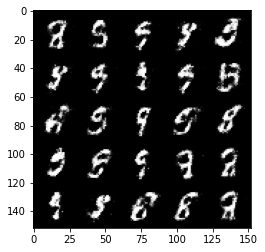

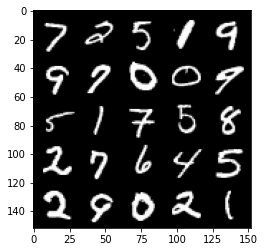

Step 33500: Generator loss: 2.603973918914796, discriminator loss: 0.23529542726278282


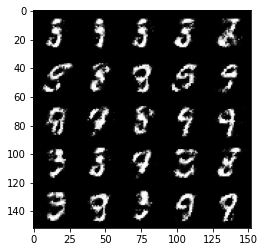

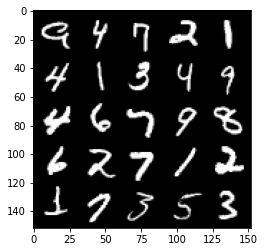

Step 34000: Generator loss: 2.6050609750747684, discriminator loss: 0.2491104275882244


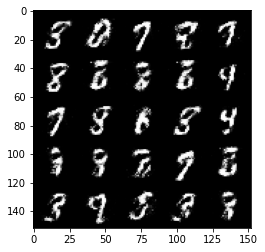

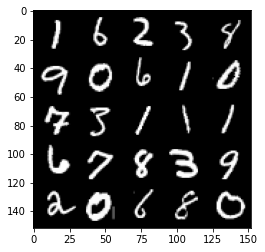

Step 34500: Generator loss: 2.450855854988098, discriminator loss: 0.269079780340195


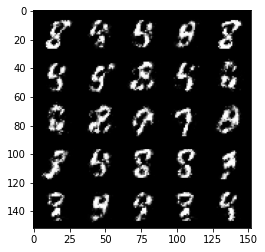

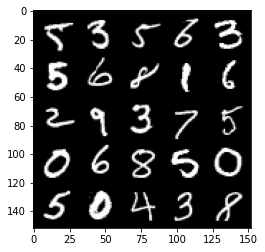

Step 35000: Generator loss: 2.472523831367493, discriminator loss: 0.246128242045641


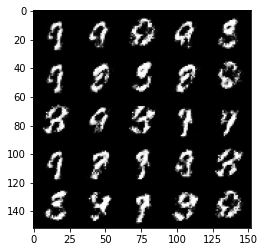

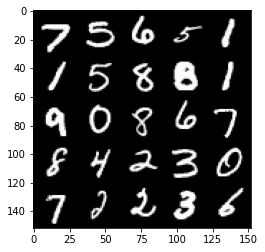

Step 35500: Generator loss: 2.5818230772018422, discriminator loss: 0.2452006666958333


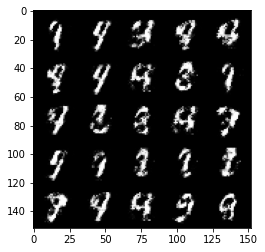

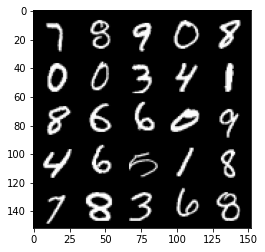

Step 36000: Generator loss: 2.6467055883407573, discriminator loss: 0.23512543433904637


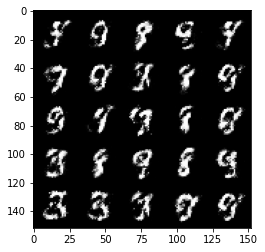

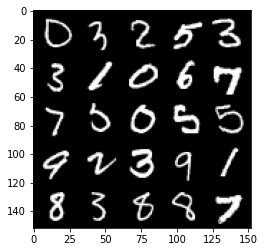

Step 36500: Generator loss: 2.4913159763813, discriminator loss: 0.2703623964190482


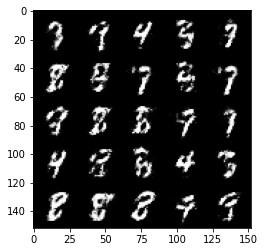

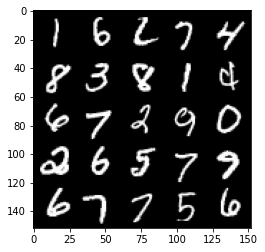

Step 37000: Generator loss: 2.4820945537090298, discriminator loss: 0.2776835630536078


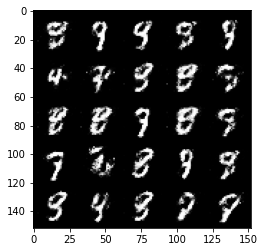

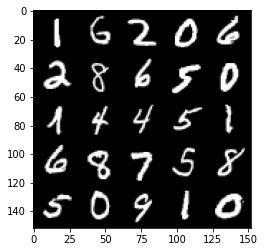

Step 37500: Generator loss: 2.4483831577301043, discriminator loss: 0.2751320188641546


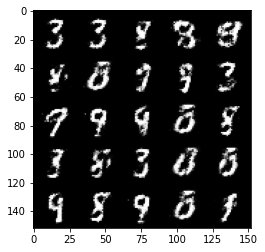

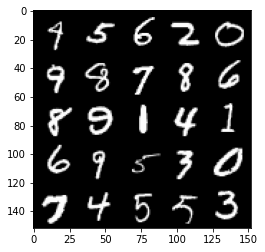

Step 38000: Generator loss: 2.516886187314986, discriminator loss: 0.24321092784404733


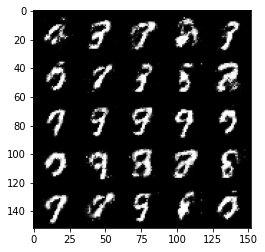

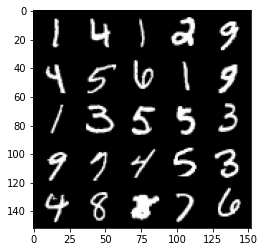

Step 38500: Generator loss: 2.550617284297944, discriminator loss: 0.24110478040575975


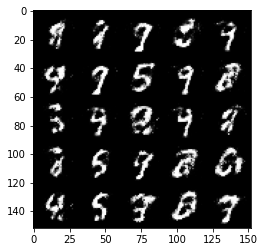

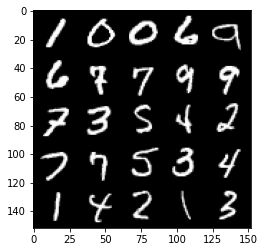

Step 39000: Generator loss: 2.514216096878054, discriminator loss: 0.2483164811134339


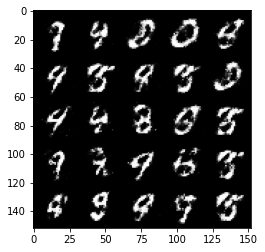

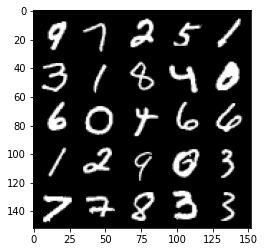

Step 39500: Generator loss: 2.495223814010623, discriminator loss: 0.24928899800777435


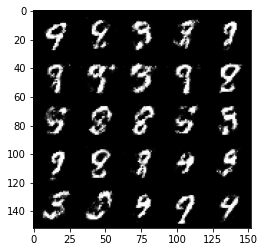

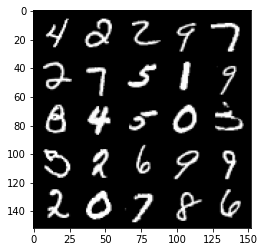

Step 40000: Generator loss: 2.511022860765459, discriminator loss: 0.2540369886159898


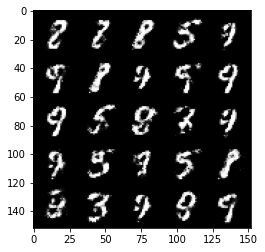

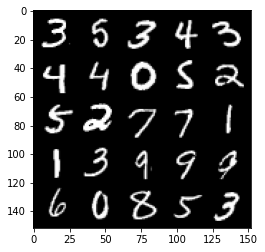

Step 40500: Generator loss: 2.3620875427722963, discriminator loss: 0.26836799237132053


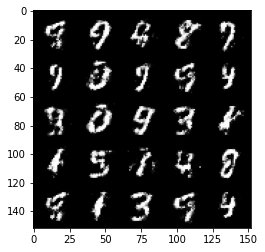

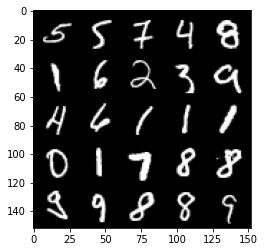

Step 41000: Generator loss: 2.3593955414295213, discriminator loss: 0.2816464924216271


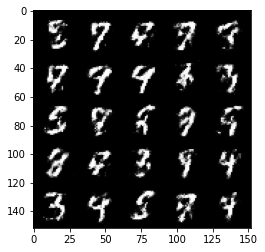

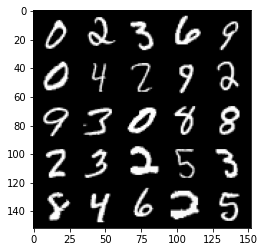

Step 41500: Generator loss: 2.320720485210421, discriminator loss: 0.28464266145229355


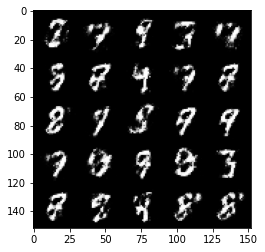

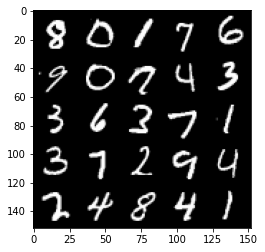

Step 42000: Generator loss: 2.1676390957832363, discriminator loss: 0.30625349965691595


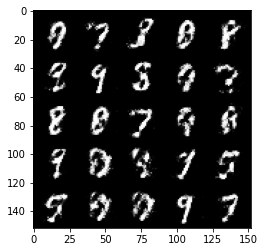

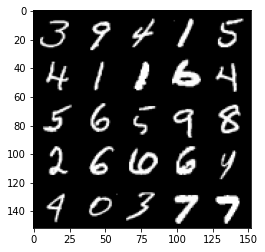

Step 42500: Generator loss: 2.1369828052520745, discriminator loss: 0.30428900405764564


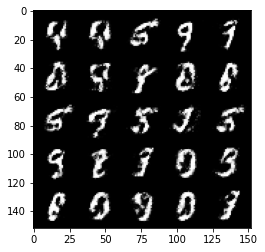

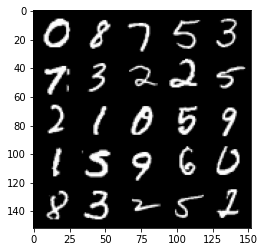

Step 43000: Generator loss: 2.1817797875404366, discriminator loss: 0.321381757616997


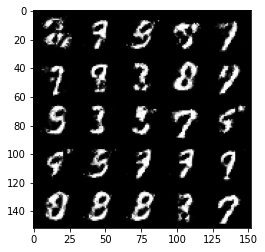

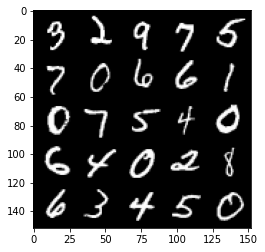

Step 43500: Generator loss: 2.0667545206546785, discriminator loss: 0.32859508004784604


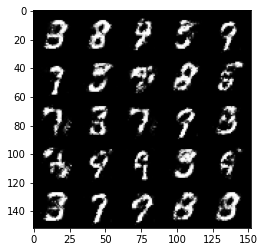

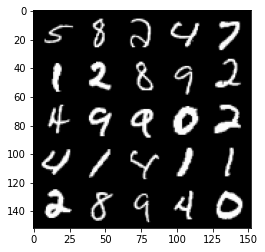

Step 44000: Generator loss: 2.0859490656852704, discriminator loss: 0.32255528879165635


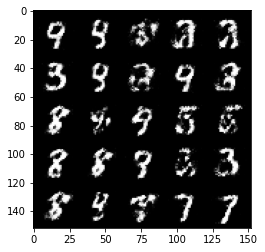

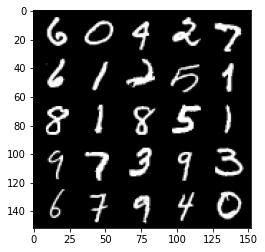

Step 44500: Generator loss: 2.1238995172977466, discriminator loss: 0.327417791754007


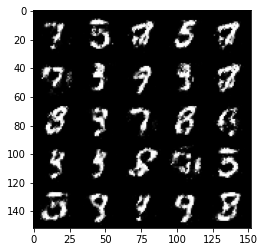

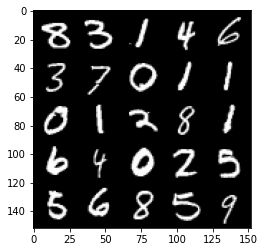

Step 45000: Generator loss: 2.0886728384494786, discriminator loss: 0.33049671033024786


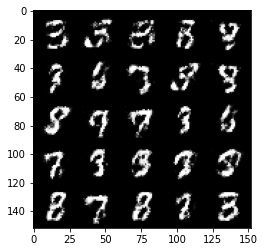

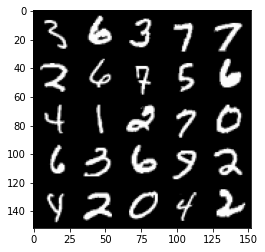

Step 45500: Generator loss: 2.1112937555313107, discriminator loss: 0.33245978173613533


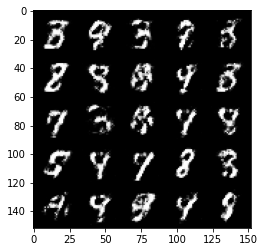

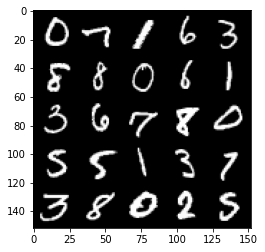

Step 46000: Generator loss: 1.987440240621565, discriminator loss: 0.35948464304208727


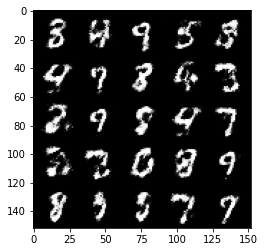

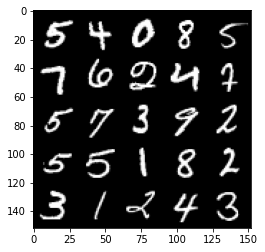

Step 46500: Generator loss: 2.00337974023819, discriminator loss: 0.34164086419343964


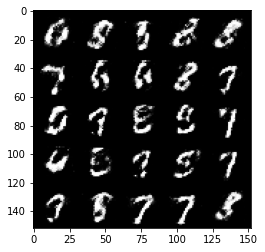

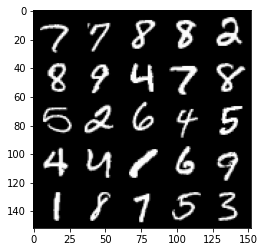

Step 47000: Generator loss: 2.084122273921969, discriminator loss: 0.3242439918518066


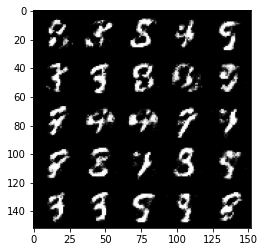

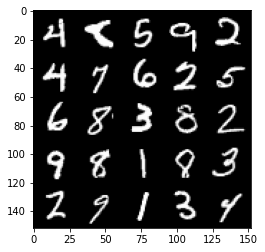

Step 47500: Generator loss: 2.1293353586196915, discriminator loss: 0.3107605349123478


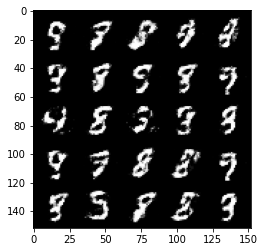

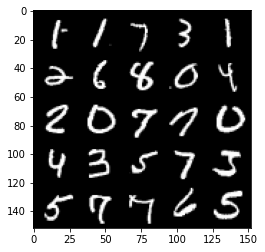

Step 48000: Generator loss: 2.230866957426073, discriminator loss: 0.2886033533513543


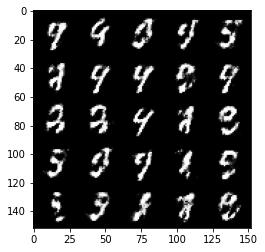

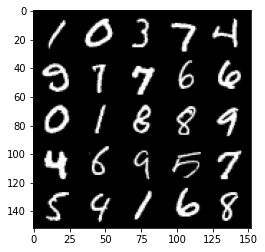

Step 48500: Generator loss: 1.9929865307807928, discriminator loss: 0.3672821652293209


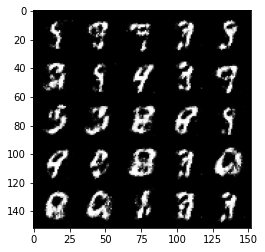

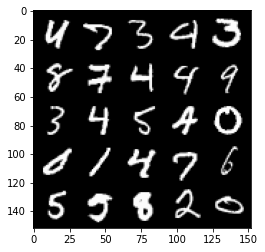

Step 49000: Generator loss: 2.070463706493378, discriminator loss: 0.316579482793808


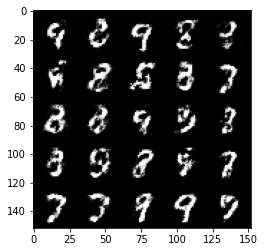

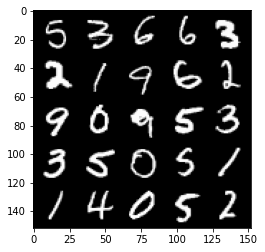

Step 49500: Generator loss: 2.0283243477344532, discriminator loss: 0.33369251906871783


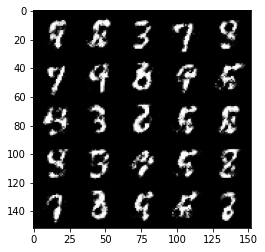

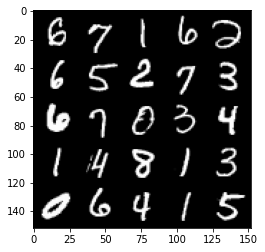

Step 50000: Generator loss: 1.9963223841190338, discriminator loss: 0.34289789360761624


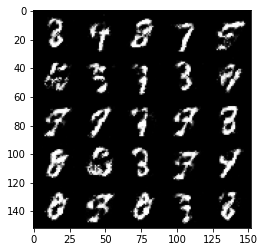

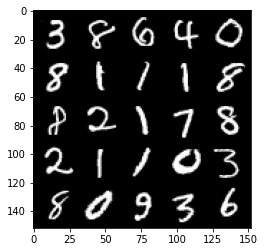

Step 50500: Generator loss: 2.078716392517089, discriminator loss: 0.31991014081239705


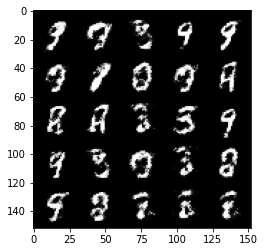

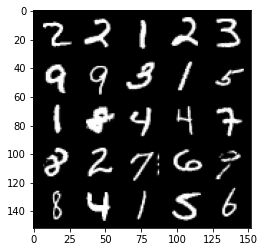

Step 51000: Generator loss: 2.0395681445598592, discriminator loss: 0.3321498957276345


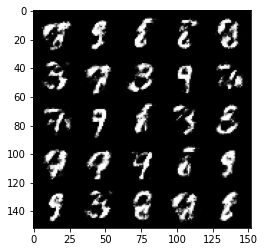

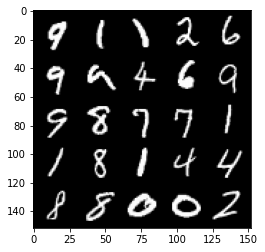

Step 51500: Generator loss: 1.980869037866592, discriminator loss: 0.34450566720962544


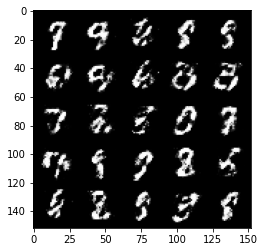

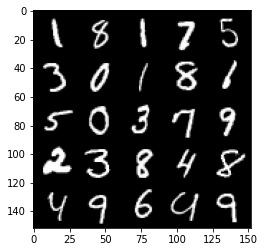

Step 52000: Generator loss: 1.9575205743312833, discriminator loss: 0.334546939343214


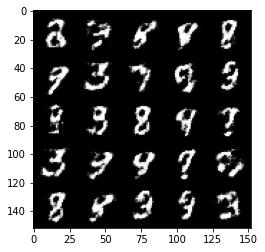

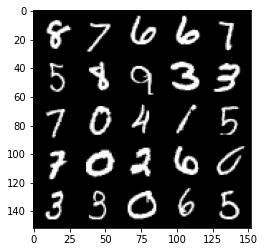

Step 52500: Generator loss: 1.917954694509508, discriminator loss: 0.3549373554885387


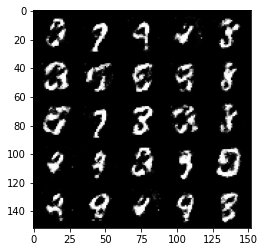

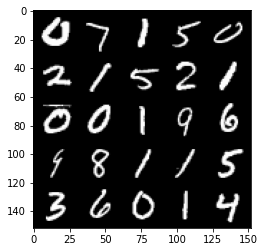

Step 53000: Generator loss: 1.9710003921985617, discriminator loss: 0.3228000675141812


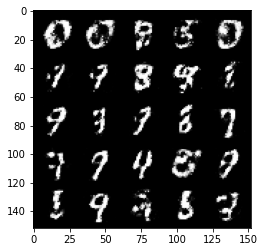

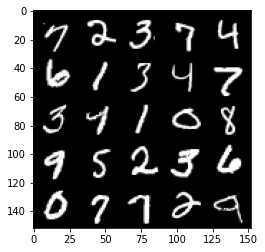

Step 53500: Generator loss: 1.9562894670963284, discriminator loss: 0.34480900123715413


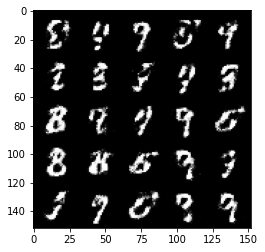

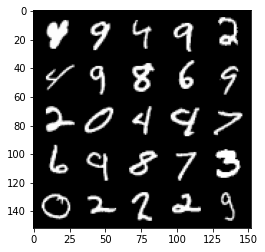

Step 54000: Generator loss: 1.9520069344043713, discriminator loss: 0.3517406662106515


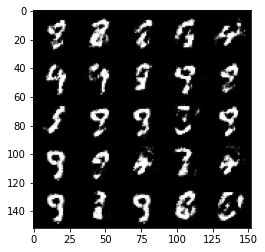

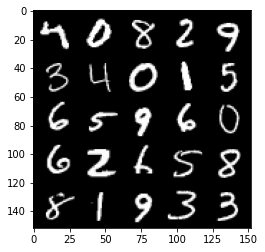

Step 54500: Generator loss: 2.004360081195832, discriminator loss: 0.32649178260564776


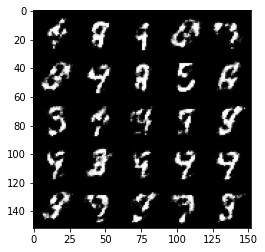

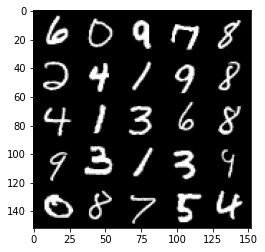

Step 55000: Generator loss: 1.9965417401790624, discriminator loss: 0.3328476319313053


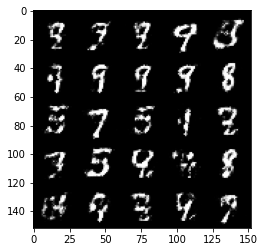

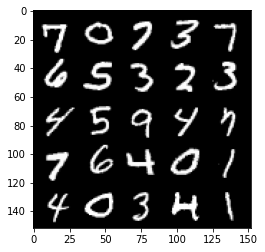

Step 55500: Generator loss: 1.930886600494382, discriminator loss: 0.3400769586265084


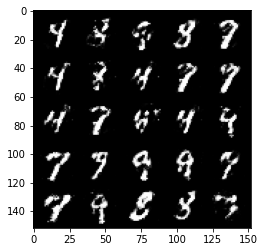

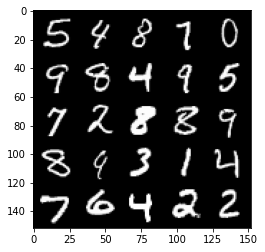

Step 56000: Generator loss: 1.9547433528900144, discriminator loss: 0.34797696006298073


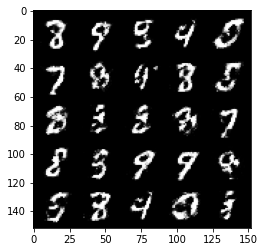

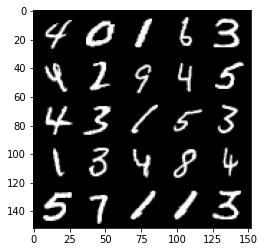

Step 56500: Generator loss: 1.7736952559947965, discriminator loss: 0.402865050494671


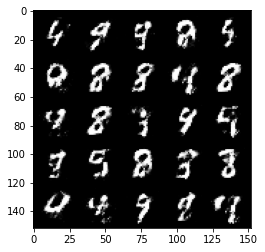

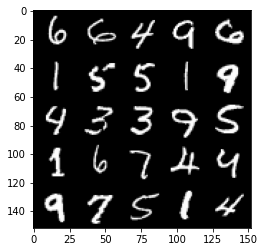

Step 57000: Generator loss: 1.8003278675079346, discriminator loss: 0.38126175040006666


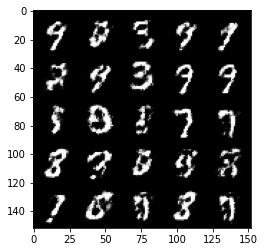

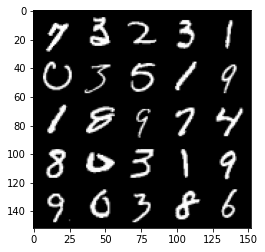

Step 57500: Generator loss: 1.780106186389923, discriminator loss: 0.37642324393987675


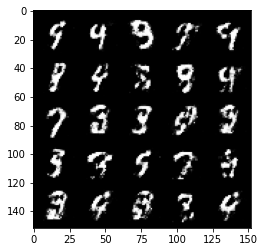

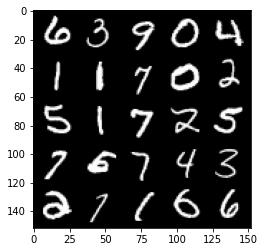

Step 58000: Generator loss: 1.7616806230545043, discriminator loss: 0.39139820158481575


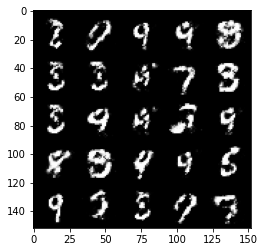

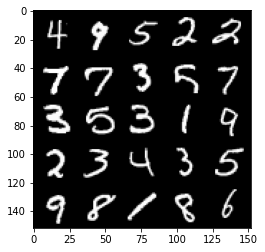

Step 58500: Generator loss: 1.7453333451747879, discriminator loss: 0.3938234125971792


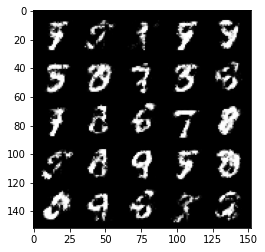

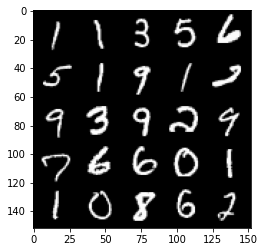

Step 59000: Generator loss: 1.699105148553848, discriminator loss: 0.37652813476324065


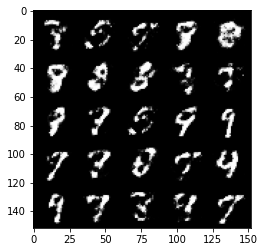

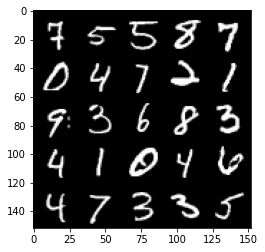

Step 59500: Generator loss: 1.7397066426277157, discriminator loss: 0.3896759253740304


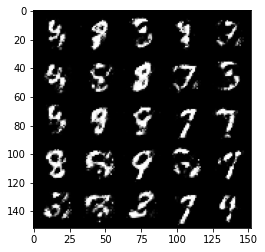

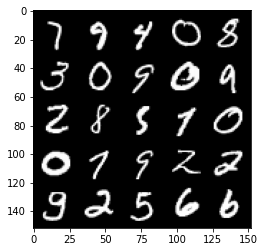

Step 60000: Generator loss: 1.7742633936405168, discriminator loss: 0.3760734096169471


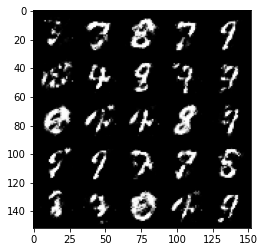

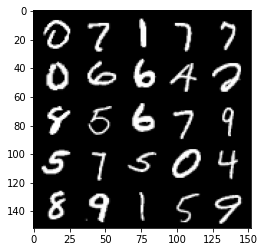

Step 60500: Generator loss: 1.7719068934917463, discriminator loss: 0.37990495556592924


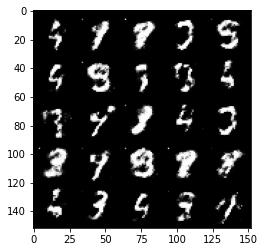

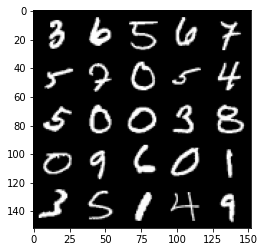

Step 61000: Generator loss: 1.661159336090087, discriminator loss: 0.40314310413598997


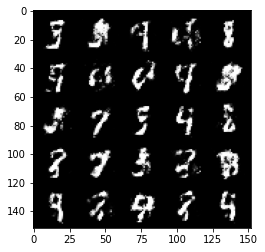

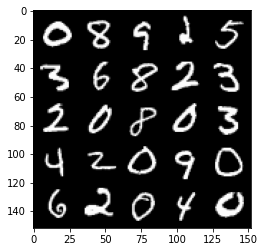

Step 61500: Generator loss: 1.8266275646686547, discriminator loss: 0.3502669197320934


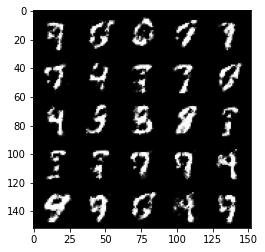

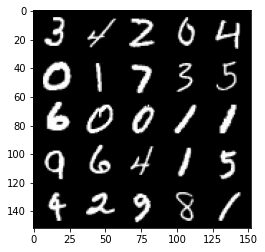

Step 62000: Generator loss: 1.755665734291077, discriminator loss: 0.3744848191142084


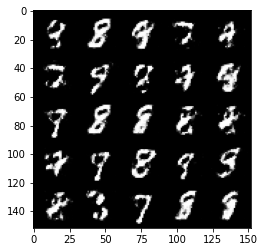

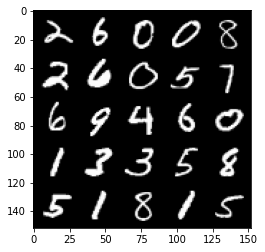

Step 62500: Generator loss: 1.7393927073478708, discriminator loss: 0.391767113983631


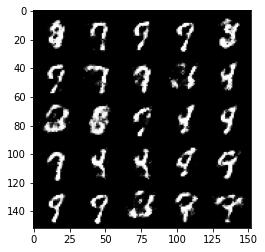

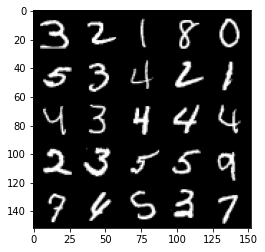

Step 63000: Generator loss: 1.7739712817668905, discriminator loss: 0.38417135220766024


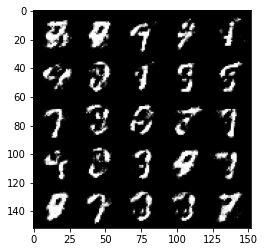

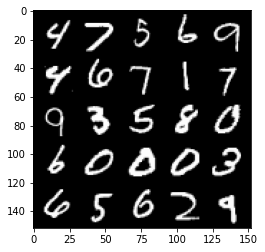

Step 63500: Generator loss: 1.7773563492298137, discriminator loss: 0.3651679997444151


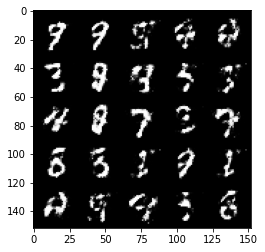

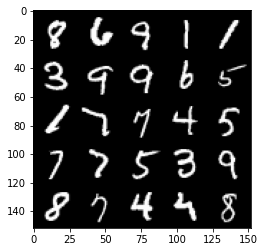

Step 64000: Generator loss: 1.810001368522646, discriminator loss: 0.3616205023527146


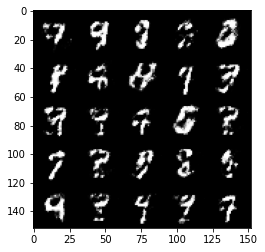

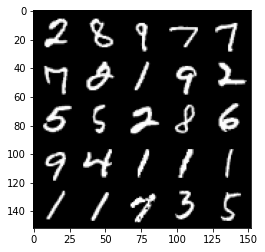

Step 64500: Generator loss: 1.7297440600395209, discriminator loss: 0.3862220717072482


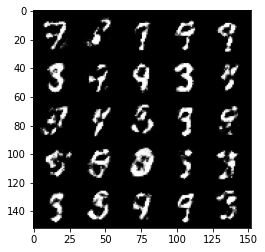

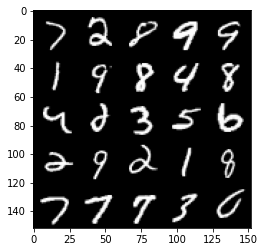

Step 65000: Generator loss: 1.7586829583644878, discriminator loss: 0.37080810934305153


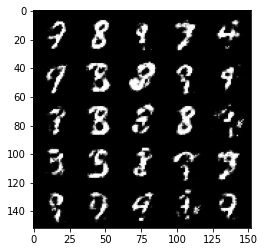

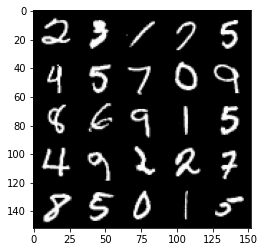

Step 65500: Generator loss: 1.7085525639057142, discriminator loss: 0.3874408239722254


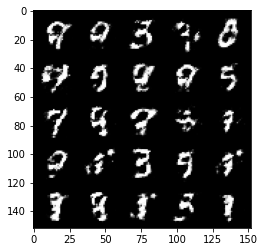

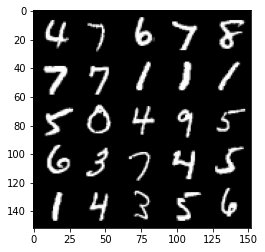

Step 66000: Generator loss: 1.7812025315761584, discriminator loss: 0.38168106031417837


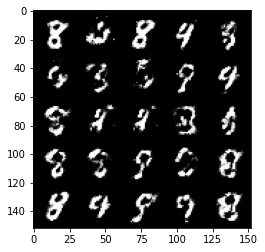

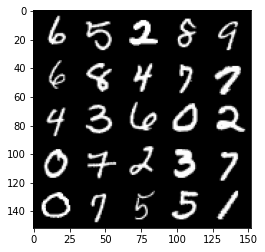

Step 66500: Generator loss: 1.6643302476406097, discriminator loss: 0.40380790019035334


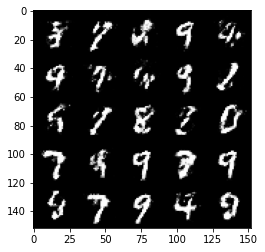

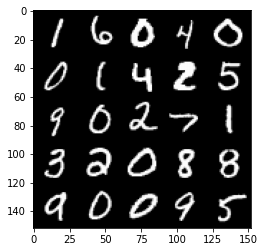

Step 67000: Generator loss: 1.7854573302268968, discriminator loss: 0.36718876141309753


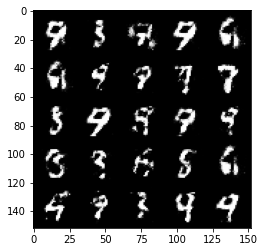

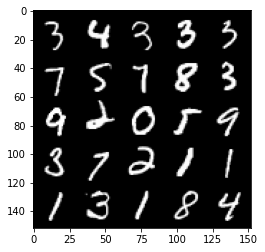

Step 67500: Generator loss: 1.6802459027767171, discriminator loss: 0.4010883728265761


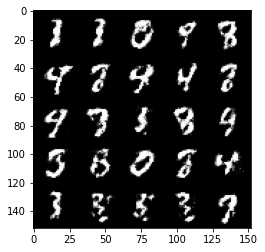

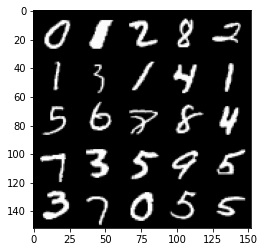

Step 68000: Generator loss: 1.6702039070129384, discriminator loss: 0.3849088978767389


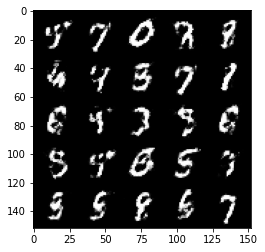

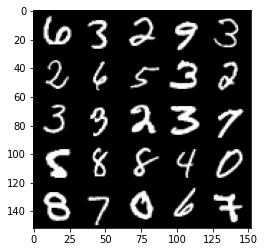

Step 68500: Generator loss: 1.7674066922664637, discriminator loss: 0.36322849079966546


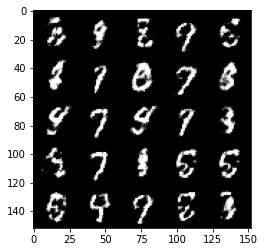

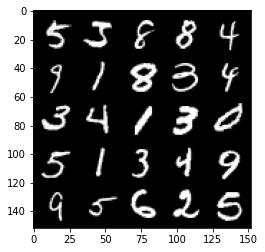

Step 69000: Generator loss: 1.6561072809696216, discriminator loss: 0.40540817874670027


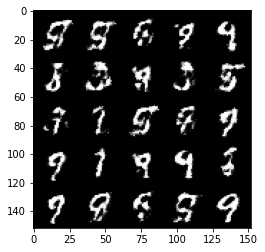

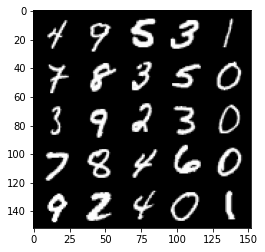

Step 69500: Generator loss: 1.7009834072589882, discriminator loss: 0.37816209053993216


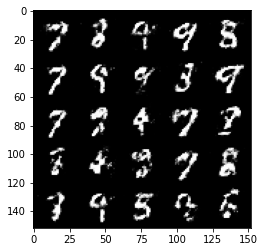

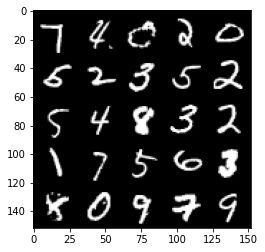

Step 70000: Generator loss: 1.6043136820793145, discriminator loss: 0.4158734865784645


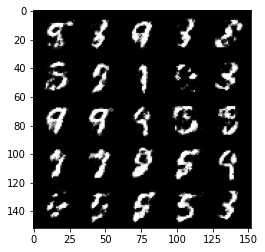

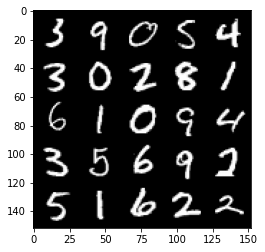

Step 70500: Generator loss: 1.680167523384094, discriminator loss: 0.38444495344161994


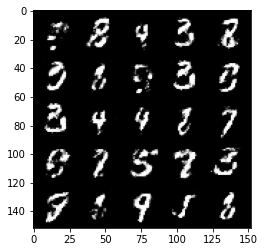

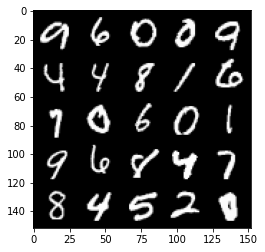

Step 71000: Generator loss: 1.6646067550182335, discriminator loss: 0.39211512404680243


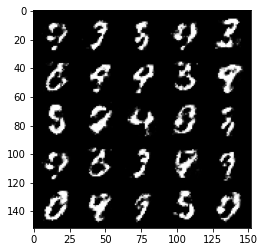

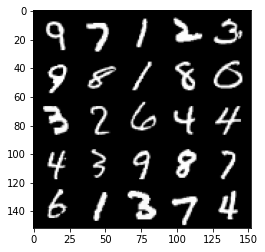

Step 71500: Generator loss: 1.729431958436967, discriminator loss: 0.3747473453879354


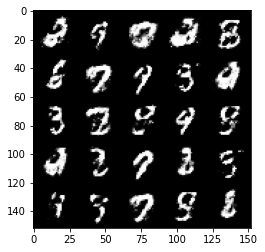

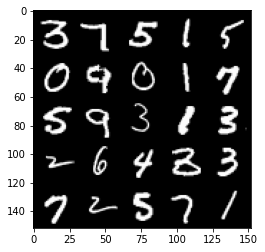

Step 72000: Generator loss: 1.696928043842314, discriminator loss: 0.3725149384737011


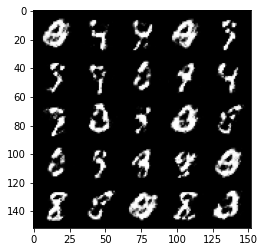

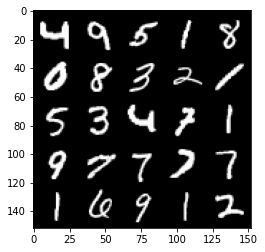

Step 72500: Generator loss: 1.633062223196028, discriminator loss: 0.40317220753431293


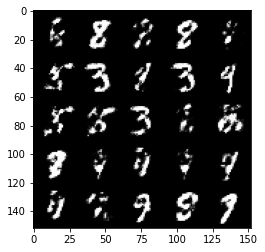

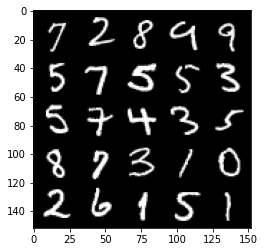

Step 73000: Generator loss: 1.5658561205863957, discriminator loss: 0.4153103334903717


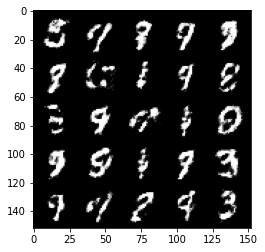

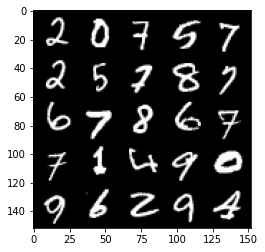

Step 73500: Generator loss: 1.5685681440830226, discriminator loss: 0.42519204568862917


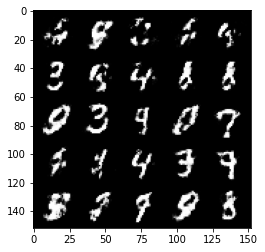

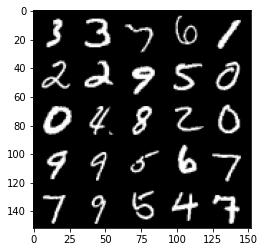

Step 74000: Generator loss: 1.5763850305080418, discriminator loss: 0.4159144162535664


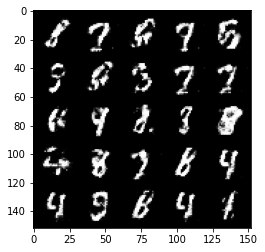

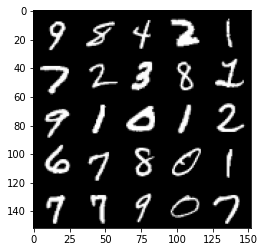

Step 74500: Generator loss: 1.526780071258546, discriminator loss: 0.43767746639251703


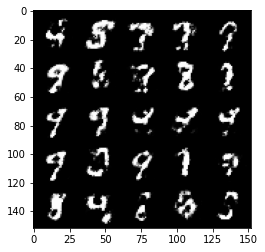

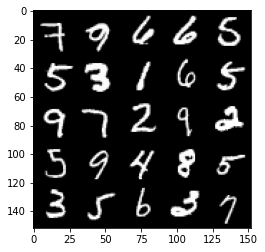

Step 75000: Generator loss: 1.5061805632114411, discriminator loss: 0.4364330567121509


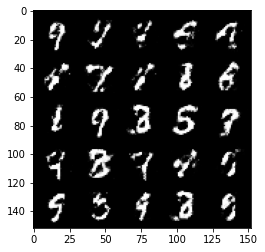

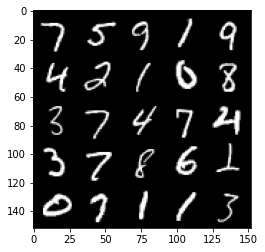

Step 75500: Generator loss: 1.4782690207958231, discriminator loss: 0.4473037813305852


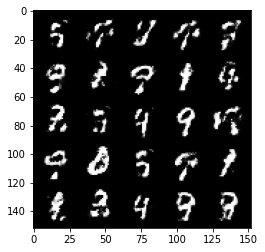

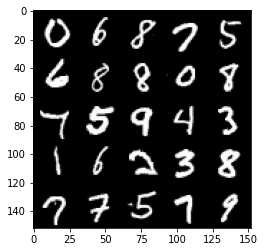

Step 76000: Generator loss: 1.5583769207000735, discriminator loss: 0.41621516996622104


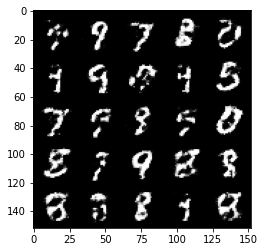

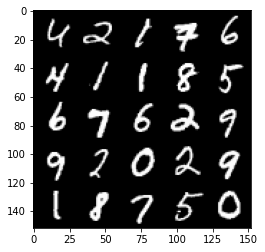

Step 76500: Generator loss: 1.542649592399598, discriminator loss: 0.42367019963264463


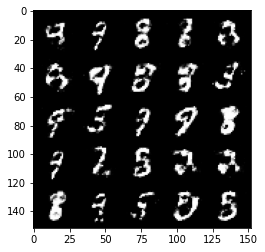

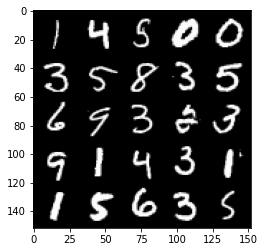

Step 77000: Generator loss: 1.5279353551864614, discriminator loss: 0.4090394362807271


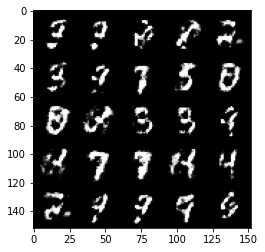

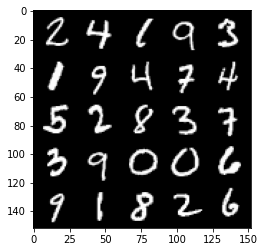

Step 77500: Generator loss: 1.552663627624512, discriminator loss: 0.41247691714763646


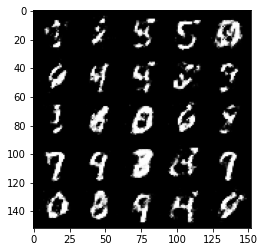

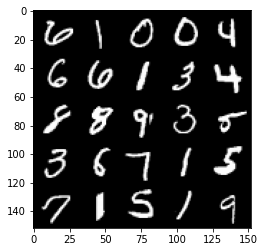

Step 78000: Generator loss: 1.5447185809612272, discriminator loss: 0.41714092600345626


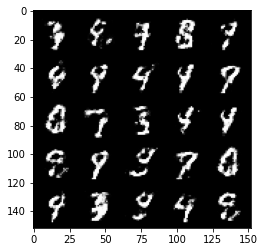

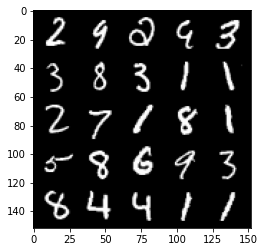

Step 78500: Generator loss: 1.4648493134975427, discriminator loss: 0.4540362675189973


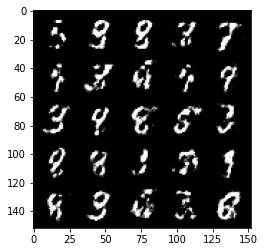

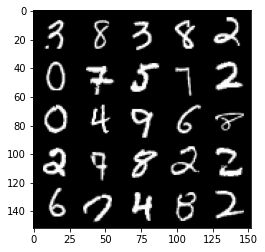

Step 79000: Generator loss: 1.541744415760042, discriminator loss: 0.42428668081760396


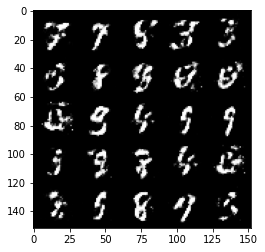

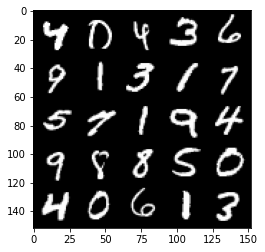

Step 79500: Generator loss: 1.5165149097442623, discriminator loss: 0.43568506401777285


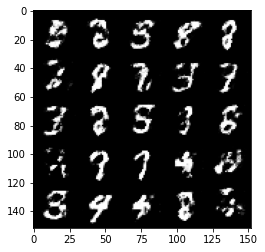

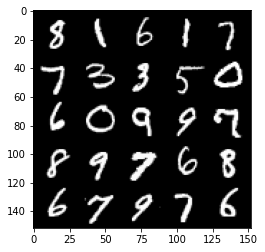

Step 80000: Generator loss: 1.4201818928718557, discriminator loss: 0.4703124607801437


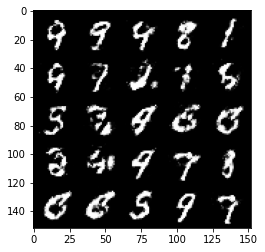

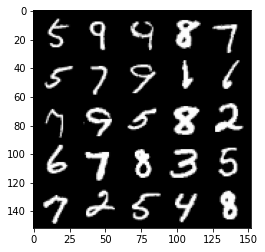

Step 80500: Generator loss: 1.4578864922523513, discriminator loss: 0.45205400323867795


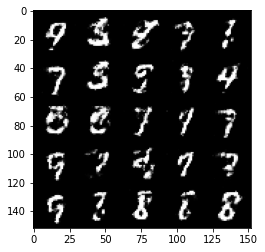

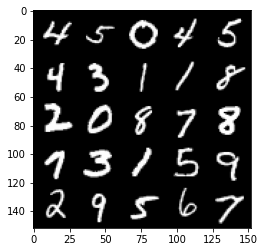

Step 81000: Generator loss: 1.4589878687858573, discriminator loss: 0.44410285353660567


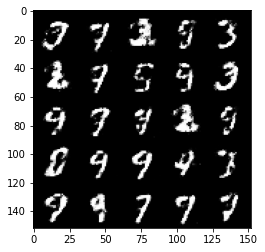

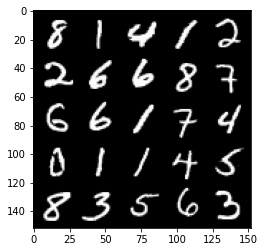

Step 81500: Generator loss: 1.487228496551515, discriminator loss: 0.42570143264532084


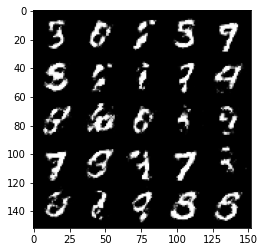

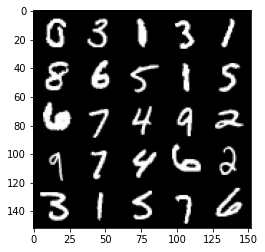

Step 82000: Generator loss: 1.4921891539096828, discriminator loss: 0.41443135398626313


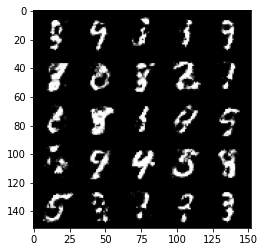

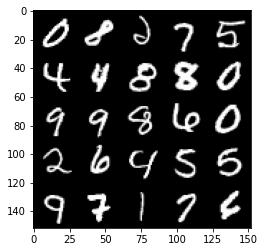

Step 82500: Generator loss: 1.521550794363022, discriminator loss: 0.4166505755782126


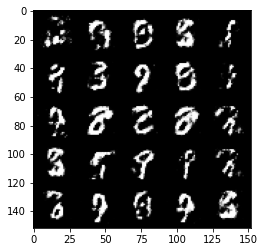

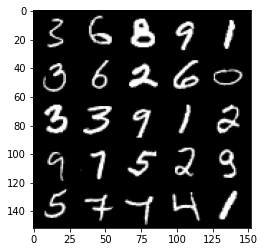

Step 83000: Generator loss: 1.422943727016449, discriminator loss: 0.45070123940706225


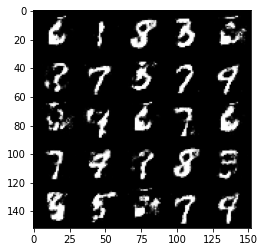

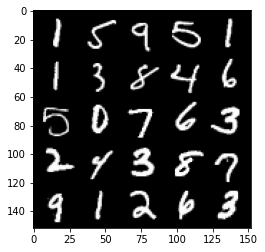

Step 83500: Generator loss: 1.5242727169990542, discriminator loss: 0.41872072333097465


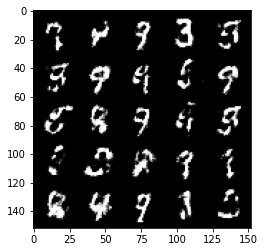

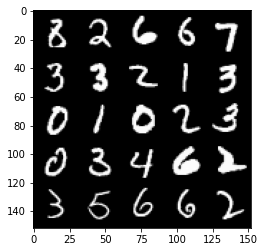

Step 84000: Generator loss: 1.4477302124500273, discriminator loss: 0.43877427458763113


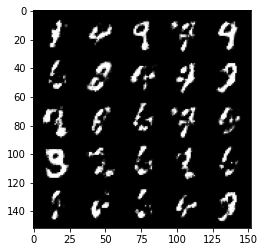

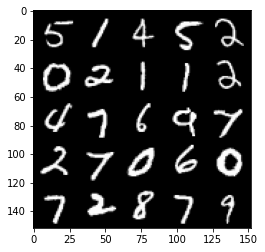

Step 84500: Generator loss: 1.5331231379508963, discriminator loss: 0.41516227728128424


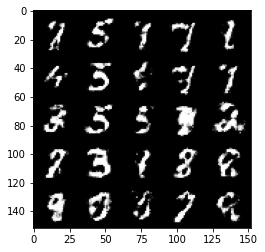

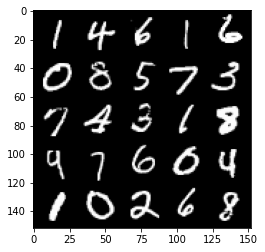

Step 85000: Generator loss: 1.517023310899736, discriminator loss: 0.40550430536270143


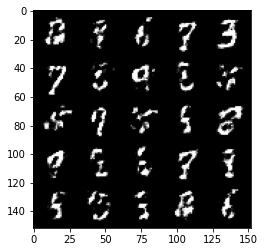

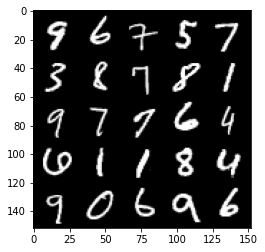

Step 85500: Generator loss: 1.4587682383060465, discriminator loss: 0.43820344012975704


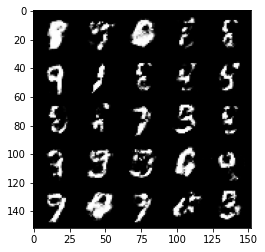

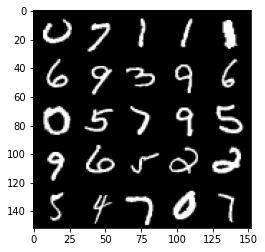

Step 86000: Generator loss: 1.4365339183807402, discriminator loss: 0.448635289132595


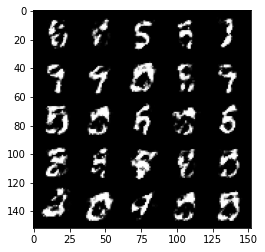

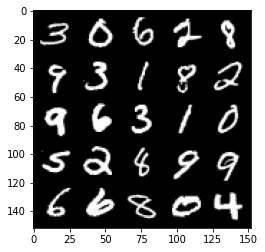

Step 86500: Generator loss: 1.48093190741539, discriminator loss: 0.43090636718273173


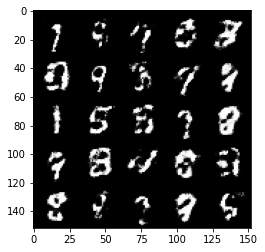

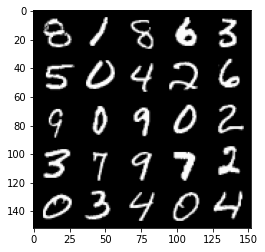

Step 87000: Generator loss: 1.4018148944377888, discriminator loss: 0.46447929942607846


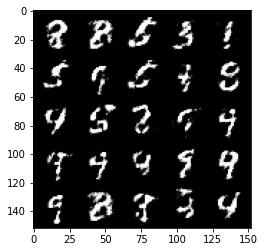

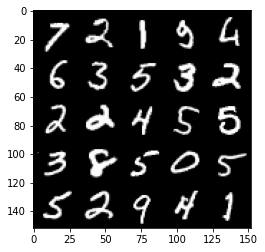

Step 87500: Generator loss: 1.454348762989043, discriminator loss: 0.45935415148735065


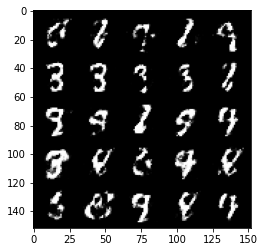

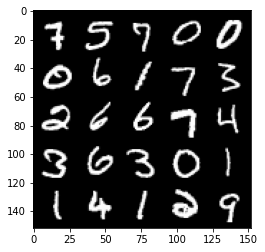

Step 88000: Generator loss: 1.3957999045848868, discriminator loss: 0.45226193416118615


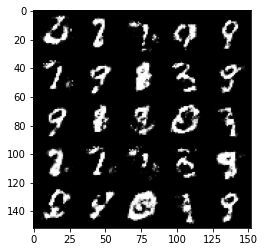

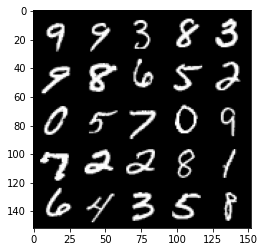

Step 88500: Generator loss: 1.4511741180419915, discriminator loss: 0.43999898576736396


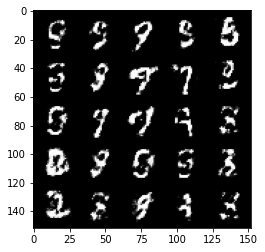

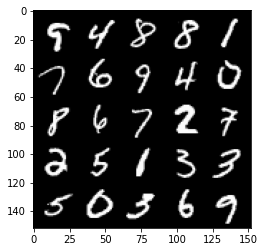

Step 89000: Generator loss: 1.491480477094652, discriminator loss: 0.4224099497795101


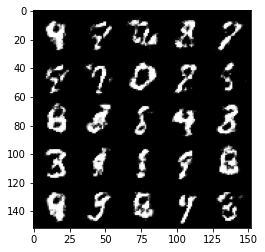

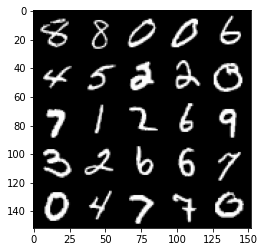

Step 89500: Generator loss: 1.4328854980468766, discriminator loss: 0.44728912621736483


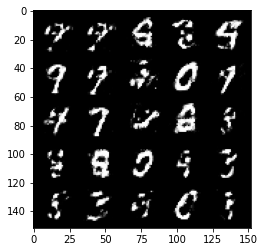

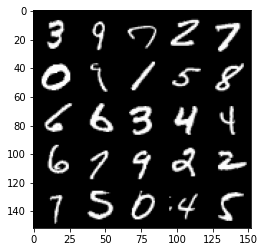

Step 90000: Generator loss: 1.4077076144218463, discriminator loss: 0.4527565476894381


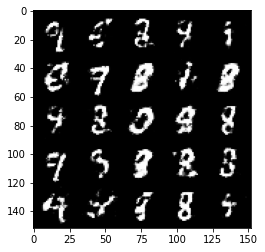

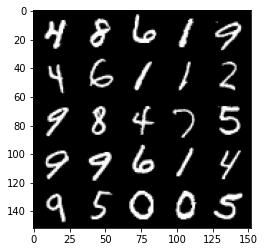

Step 90500: Generator loss: 1.509067141532897, discriminator loss: 0.41863043725490606


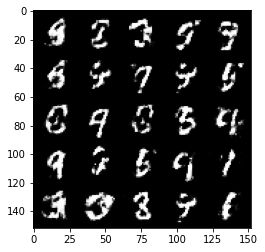

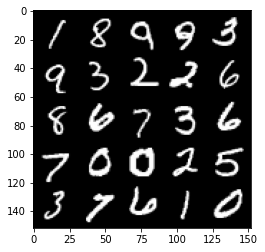

Step 91000: Generator loss: 1.4478441338539139, discriminator loss: 0.4490653812289236


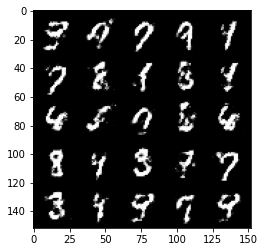

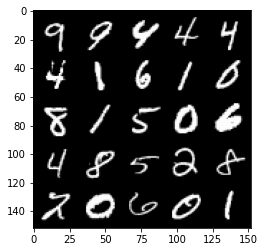

Step 91500: Generator loss: 1.4871883323192605, discriminator loss: 0.42915109139680874


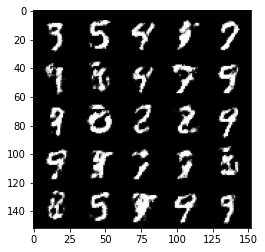

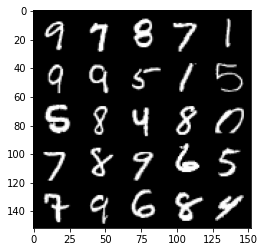

Step 92000: Generator loss: 1.3788565905094141, discriminator loss: 0.4727277776598928


In [ ]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad() # Zero out the gradients before backpropagation
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device) # Calculate generator loss
        gen_loss.backward(retain_graph=True) # Update gradients
        gen_opt.step() # Update optimizer
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


If you don't get any runtime error, it means that your code works. We check that the weights are changing in each iteration within the function.

**Congratulations, you have trained your first GAN**